In [2]:
# Name: Indrale Tushar Balaji
# Reg No: 21BDS0306
# github Link: https://github.com/tushar5745/EDA_21BDS0306/tree/main

Dataset Dimensions: (1230, 24)

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1230 entries, 0 to 1229
Data columns (total 24 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   rownames  1230 non-null   int64  
 1   wage      1230 non-null   float64
 2   abil      1230 non-null   float64
 3   educ      1230 non-null   int64  
 4   ne        1230 non-null   int64  
 5   nc        1230 non-null   int64  
 6   west      1230 non-null   int64  
 7   south     1230 non-null   int64  
 8   exper     1230 non-null   int64  
 9   motheduc  1230 non-null   int64  
 10  fatheduc  1230 non-null   int64  
 11  brkhme14  1230 non-null   int64  
 12  sibs      1230 non-null   int64  
 13  urban     1230 non-null   int64  
 14  ne18      1230 non-null   int64  
 15  nc18      1230 non-null   int64  
 16  south18   1230 non-null   int64  
 17  west18    1230 non-null   int64  
 18  urban18   1230 non-null   int64  
 19  tuit17    1230 non-null

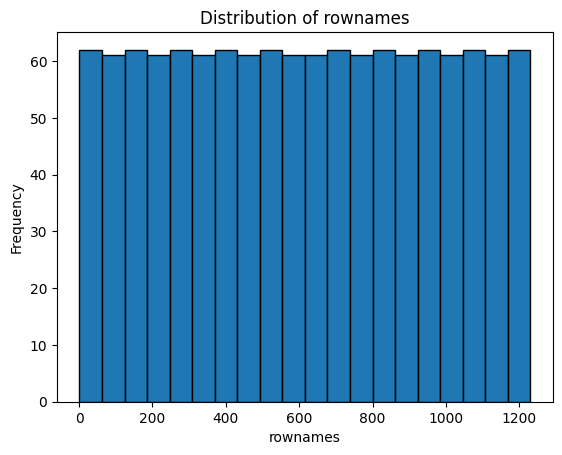

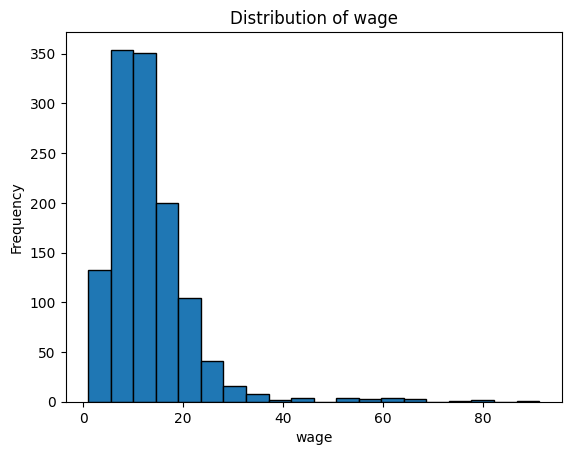

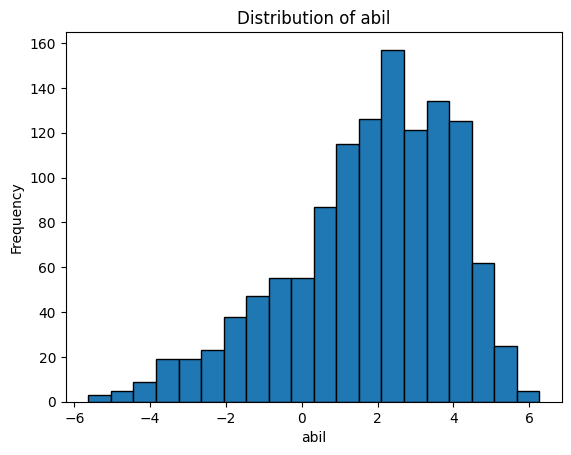

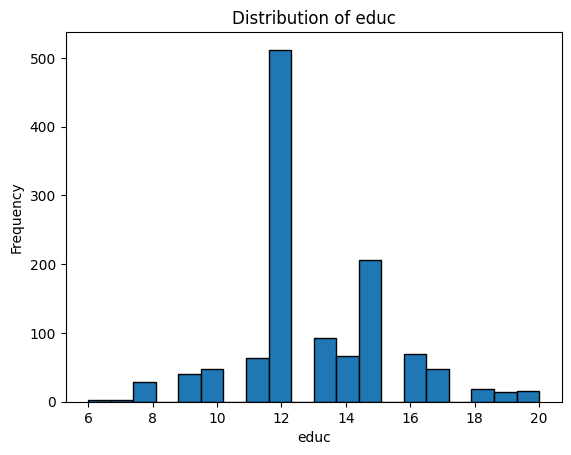

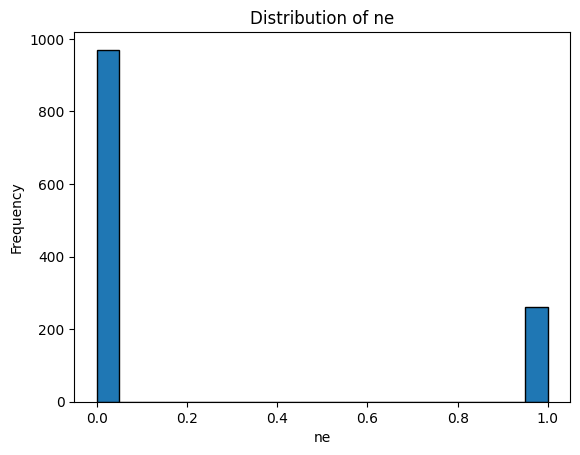

...

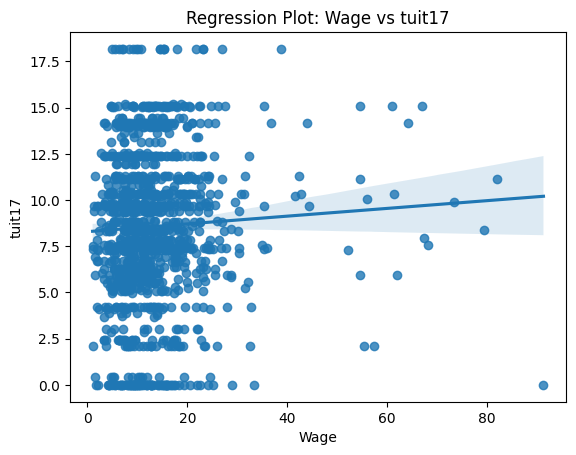

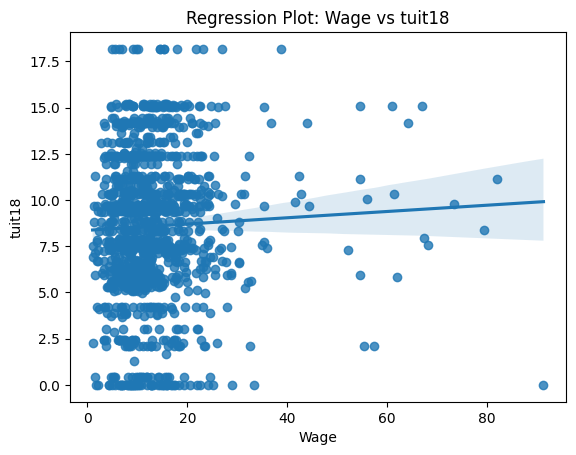

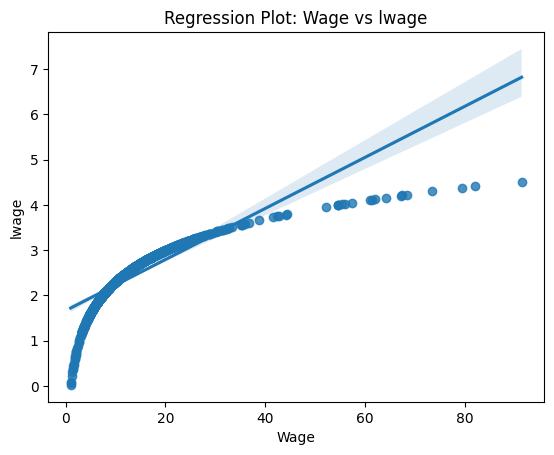

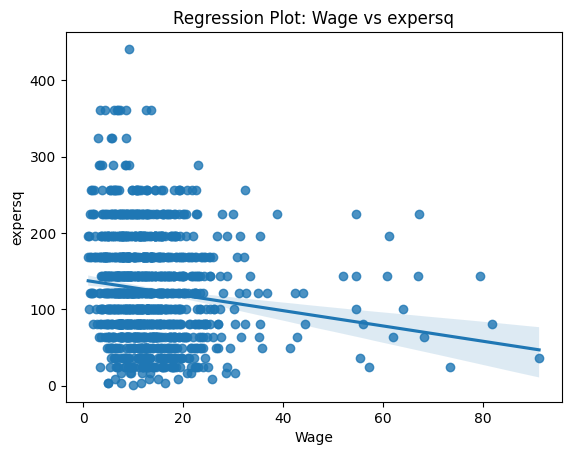

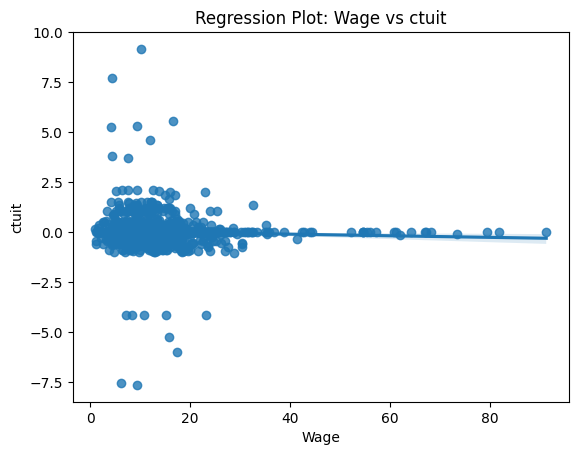


Cleaned data saved to 'cleaned_htv.csv'


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

file_name = 'htv.csv'
data = pd.read_csv(file_name)

print("Dataset Dimensions:", data.shape)
print("\nDataset Info:")
print(data.info())
print("\nSummary Statistics:")
print(data.describe())

print("\nMissing Values:")
print(data.isnull().sum())
print("\nNumber of Duplicates:", data.duplicated().sum())

data = data.drop_duplicates()
data = data.fillna(data.mean())
data.columns = [col.strip().lower().replace(" ", "_") for col in data.columns]

print("\nCleaned Data Info:")
print(data.info())

numerical_cols = data.select_dtypes(include='number').columns
for col in numerical_cols:
    plt.figure()
    plt.hist(data[col], bins=20, edgecolor='black')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

for i, col1 in enumerate(numerical_cols):
    for col2 in numerical_cols[i+1:]:
        plt.figure()
        sns.scatterplot(x=data[col1], y=data[col2])
        plt.title(f'Scatter Plot: {col1} vs {col2}')
        plt.xlabel(col1)
        plt.ylabel(col2)
        plt.show()

plt.figure(figsize=(10, 8))
correlation_matrix = data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Heatmap")
plt.show()

sns.pairplot(data)
plt.show()

categorical_cols = data.select_dtypes(include='object').columns
for cat_col in categorical_cols:
    for num_col in numerical_cols:
        plt.figure()
        sns.boxplot(x=data[cat_col], y=data[num_col])
        plt.title(f'Boxplot: {num_col} by {cat_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.show()

for col in numerical_cols:
    if col != 'wage':
        plt.figure()
        sns.regplot(x=data['wage'], y=data[col], data=data)
        plt.title(f'Regression Plot: Wage vs {col}')
        plt.xlabel('Wage')
        plt.ylabel(col)
        plt.show()

data.to_csv('cleaned_htv.csv', index=False)
print("\nCleaned data saved to 'cleaned_htv.csv'")
